<a href="https://colab.research.google.com/github/minit88/Marine_Resque_Drone/blob/main/Lab_03/_01_3_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!curl -L "https://app.roboflow.com/ds/d7VfO7nx7I?key=YoqRbECRLJ" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: train/labels/10631_jpg.rf.b6f706ee392bfc1f4270130fbe9cc043.txt  
 extracting: train/labels/10682_jpg.rf.1027c2d543c099001b9de02d2f48f965.txt  
 extracting: train/labels/10682_jpg.rf.2e48561cac84aaba5ddab0d9cc087725.txt  
 extracting: train/labels/10682_jpg.rf.c796c95125b8d37a04c84f52897ec5d3.txt  
 extracting: train/labels/10734_jpg.rf.57a9d526bbbc77dd899f30097eaca6aa.txt  
 extracting: train/labels/10734_jpg.rf.7f228c6971a92bdfb2c3d46cd66ed8e4.txt  
 extracting: train/labels/10734_jpg.rf.8a80a7e94095dcef47b50ad685c22608.txt  
 extracting: train/labels/10737_jpg.rf.1b2d8fe721d5ebe2b57400f9e2336c27.txt  
 extracting: train/labels/10737_jpg.rf.391f528ae73cb770e3c6820a30109a0a.txt  
 extracting: train/labels/10737_jpg.rf.6c428e78d6165fe73e8d8ece32b0aeb6.txt  
 extracting: train/labels/10798_jpg.rf.1fb82faae7e321a346f002bc34b20310.txt  
 extracting: train/labels/10798_jpg.rf.3781ff2426bfa77452296dfde6017588.txt  
 extracting: train/labels/10

In [ ]:
#!curl -L "https://app.roboflow.com/ds/KW6wA4IZ8s?key=x13pgjRhSM" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [ ]:
%cd /content/
!git clone https://github.com/ultralytics/yolov5

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 14397, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 14397 (delta 28), reused 41 (delta 21), pack-reused 14342
Receiving objects: 100% (14397/14397), 13.42 MiB | 15.67 MiB/s, done.
Resolving deltas: 100% (9929/9929), done.


In [ ]:
!pip install -r yolov5/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 14.1 MB/s 


In [3]:
%cat /content/drive/MyDrive/yolo/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 4
names: ['Boat', 'Person drowning', 'Person in water', 'Person out of water']

roboflow:
  workspace: project
  project: drwoning
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/project/drwoning/dataset/1

In [4]:
#클래스 개수를 num_classes에 대입
import yaml
with open("/content/drive/MyDrive/yolo/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [5]:
%cat /content/drive/MyDrive/yolo/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [6]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [9]:

%%time
%cd /content/drive/MyDrive/yolo/yolov5
!python /content/drive/MyDrive/yolo/yolov5/train.py --img 100 --batch 100 --epochs 100 --data '/content/drive/MyDrive/yolo/data.yaml' --cfg /content/drive/MyDrive/yolo/yolov5/models/yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/drive/MyDrive/yolo/yolov5
train: weights=, cfg=/content/drive/MyDrive/yolo/yolov5/models/yolov5s.yaml, data=/content/drive/MyDrive/yolo/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=100, imgsz=100, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 72, done.
remote: Counting objects: 100% (53/53), done.
remote: Total 72 (delta 52), reused 52 (delta 52), pack-reused 19
Unpacking objects: 100% (72/72), done.
From https://github.com/ultralytics/yolov5
   82a5585..02b8a4c  master     -> origin/master
 * [new branc

In [8]:
!python /content/drive/MyDrive/yolo/yolov5/detect.py --weights /content/drive/MyDrive/yolo/yolov5/runs/train/yolov5s_results/weights/best.pt --img  100 --conf 0.3 --source /content/test/images

detect: weights=['/content/drive/MyDrive/yolo/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/test/images, data=drive/MyDrive/yolo/yolov5/data/coco128.yaml, imgsz=[100, 100], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=drive/MyDrive/yolo/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: YOLOv5 requirement "ipython" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /content/drive/MyDrive/yolo/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 v6.2-224-g82a5585 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 151

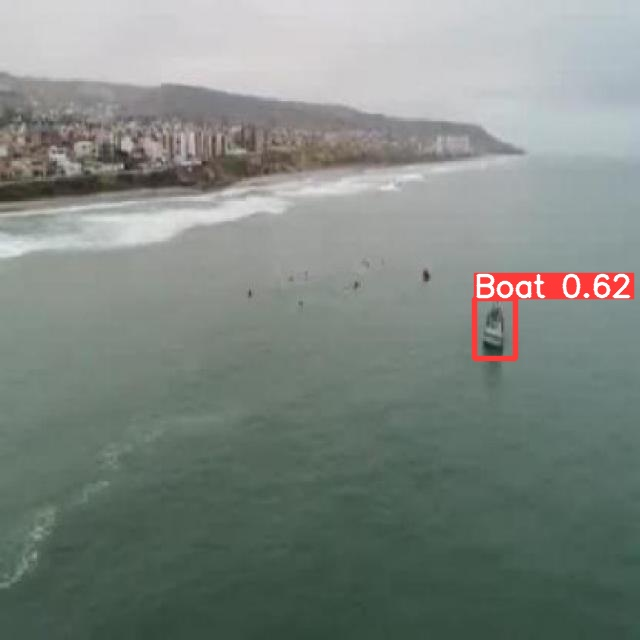

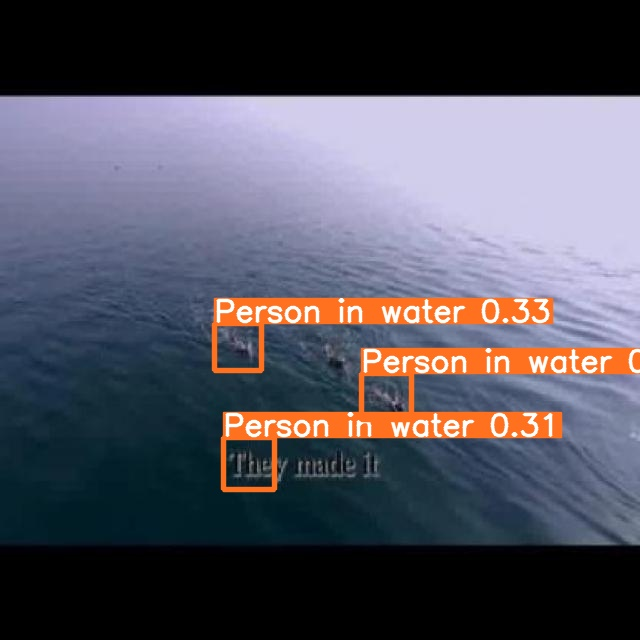

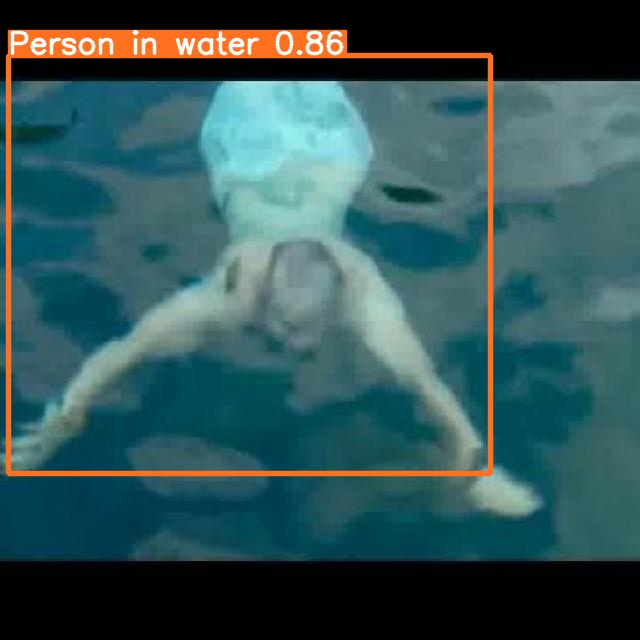

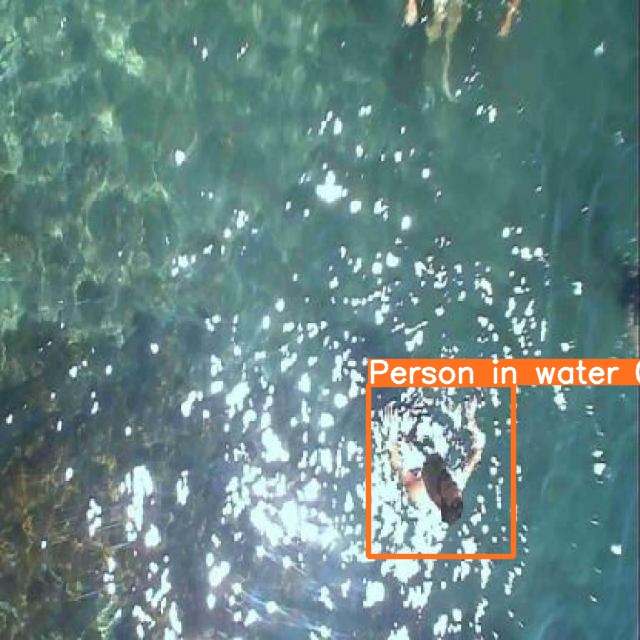

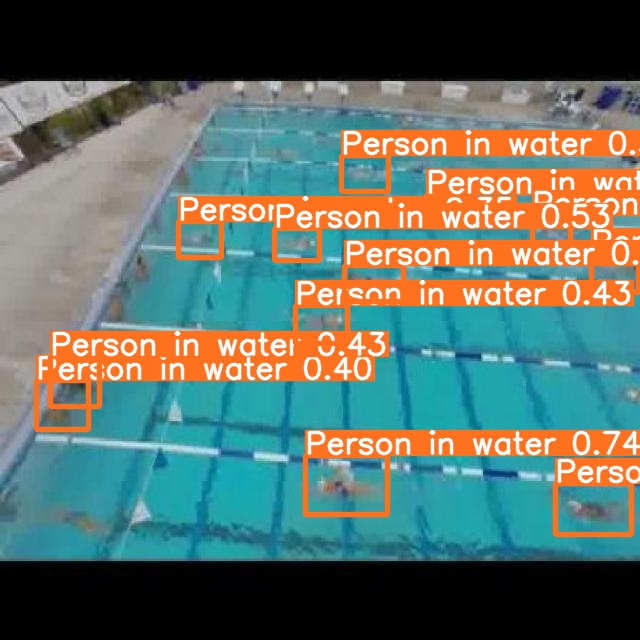

...

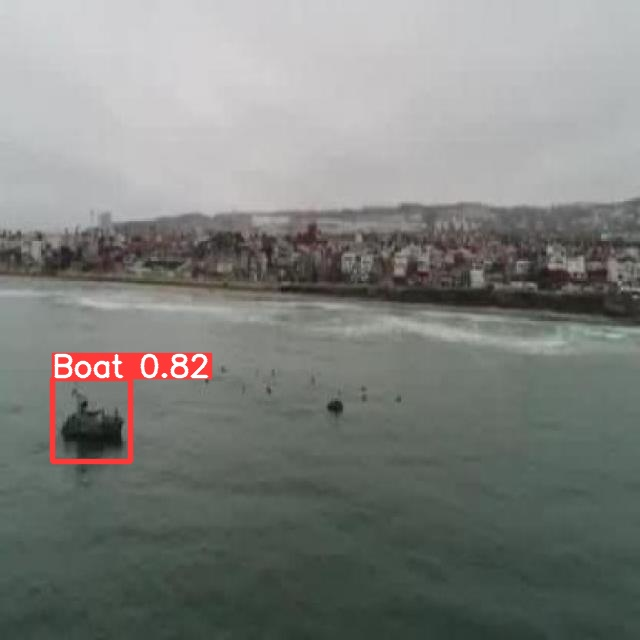

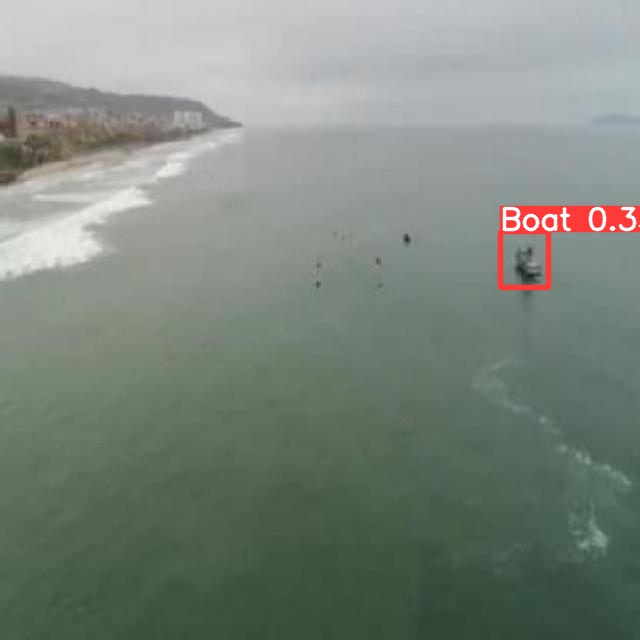

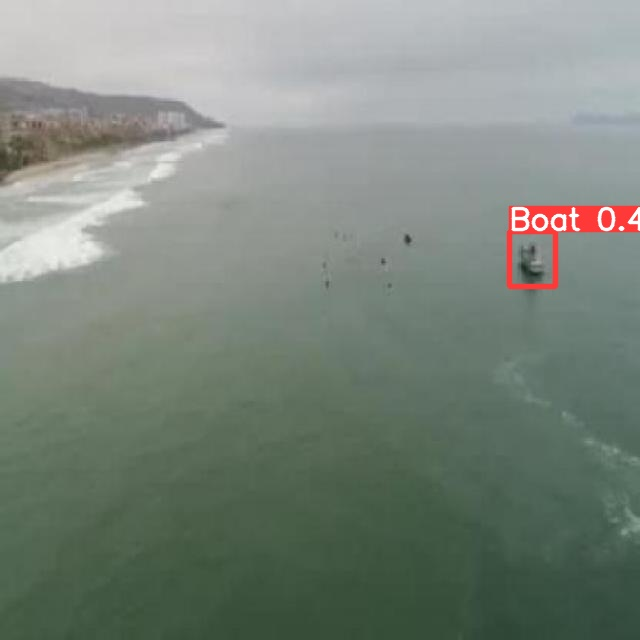

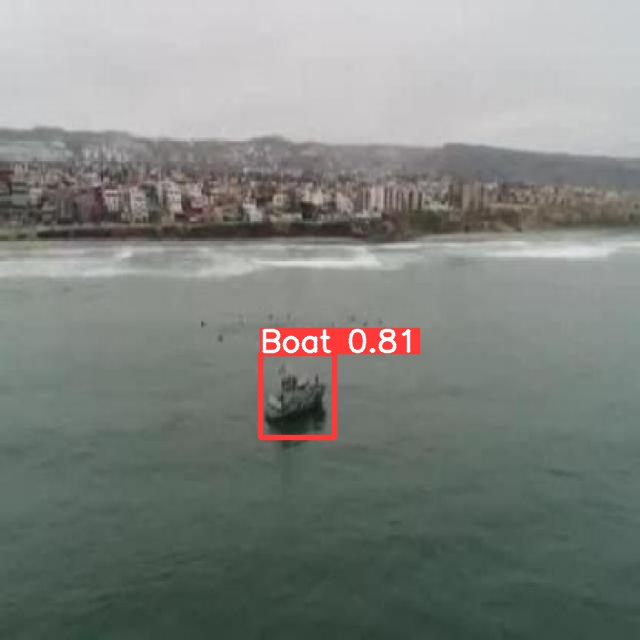

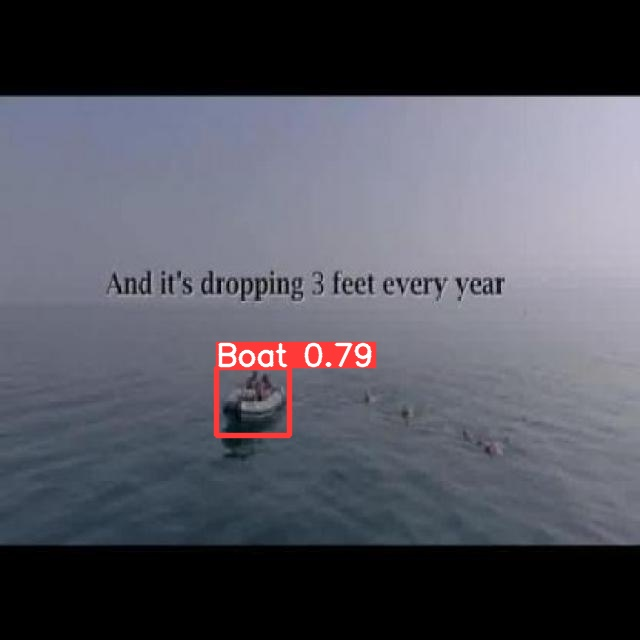

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

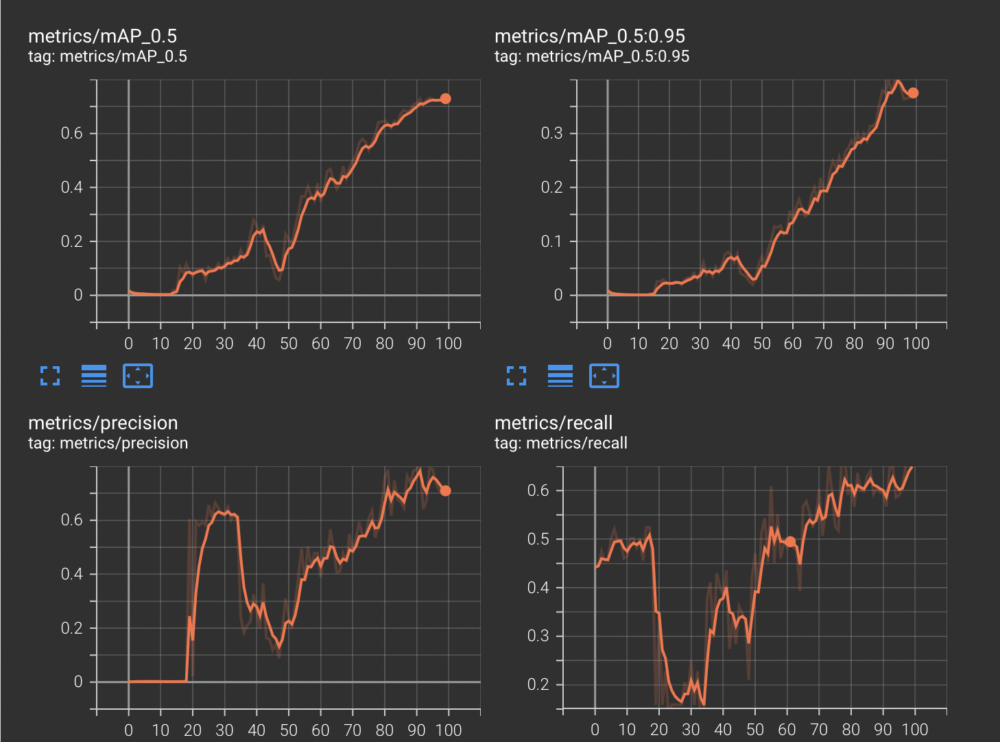

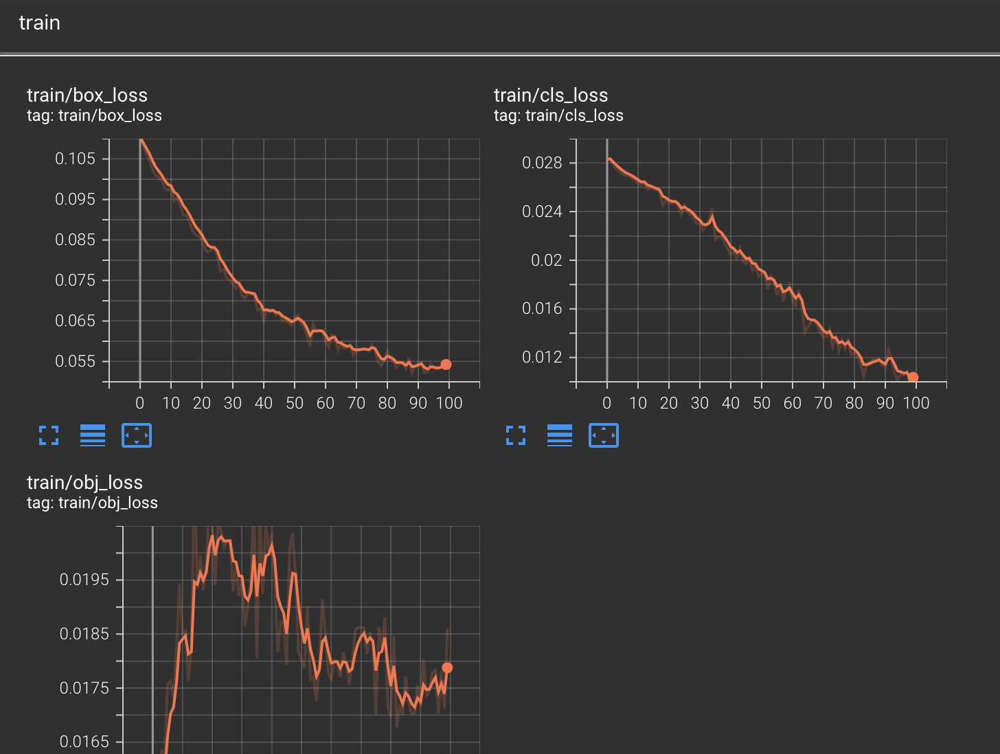

In [ ]:
pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install git+https://github.com/philferriere/cocoapi.git#subdirectory=PythonAPI

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/philferriere/cocoapi.git to /tmp/pip-req-build-2qg8hiz2
  Running command git clone -q https://github.com/philferriere/cocoapi.git /tmp/pip-req-build-2qg8hiz2
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=265235 sha256=b7aab539a4f2295a5913c54c92cb567ed1003abd200cc90f0147a89735956682
  Stored in directory: /tmp/pip-ephem-wheel-cache-267muv1t/wheels/6b/c6/c5/cb6da4cb793a6cb1ab91f6578d76c42686422127eb4dbcea94
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.5
    Uninstalling pycocotools-2.0.5:
      Successfully uninstalled pycocotools-2.0.5


In [ ]:
pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!python -h --/content/drive/MyDrive/yolo/yolov5/detect.py-- source 1

unknown option --/content/yolov5/detect.py--
usage: python3 [option] ... [-c cmd | -m mod | file | -] [arg] ...
Try `python -h' for more information.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch

# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s') 

# Images
#img = 'https://ultralytics.com/images/zidane.jpg'  # or file, Path, PIL, OpenCV, numpy, list
img = '/1085664023-preview.mp4'

# Inference
#results = model(img)

# Results
#esults.print()  # or .show(), .save(), .crop(), .pandas(), etc.
#results.save()
torch.save(model,'model.pt')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2022-11-3 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [ ]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /1085664023-preview.mp4

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/1085664023-preview.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-224-g82a5585 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/418) /1085664023-preview.mp4: 256x416 2 Boats, 9 Person in waters, 11.0ms
video 1/1 (2/418) /1085664023-preview.mp4: 256x416 2 Boats, 9 Person in waters, 7.8ms
video 1/1 (3/418) /1085664023-preview.mp4: 256x416 2 Boats, 9 Person in waters, 8.1ms
video 1/1 (4/418) /1085664023-preview.mp4: 256x416 2 Boats, 9 Person i

In [ ]:
import os, sys
#from google.colab import drive
#drive.mount('/content/drive')